In [1]:
print('Init')

Init


In [2]:
import torch
import numpy as np

print(f'Cuda available: {torch.cuda.is_available()}')

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(f'Running on: {device}, Device count: {torch.cuda.device_count()}')

Cuda available: True
Running on: cuda:0, Device count: 2


### Init dataset

In [3]:
from nuscenes import NuScenes
from custom_prediction.helper import PredictHelper

In [4]:
# This is the path where you stored your copy of the nuScenes dataset.
DATAROOT = 'D:/ThesisProjects/nuScenes_dataset/'

nusc = NuScenes('v1.0-trainval', dataroot=DATAROOT, verbose=False)

In [5]:
helper = PredictHelper(nusc)

In [6]:
from nuscenes.eval.prediction.splits import get_prediction_challenge_split

train = get_prediction_challenge_split("train", dataroot=DATAROOT)
train[:5]

['4d87aaf2d82549969f1550607ef46a63_faf2ea71b30941329a3c3f3866cec714',
 '4d87aaf2d82549969f1550607ef46a63_fa3f3d82b2b94da39f67bffc4e16d5db',
 '4d87aaf2d82549969f1550607ef46a63_903f32e4fd8247de8f20aa989e157b2a',
 '4d87aaf2d82549969f1550607ef46a63_ab44d8e463d54d0ebb18eb66bbc1e5eb',
 '4d87aaf2d82549969f1550607ef46a63_cc5951ca9cb240d5a7a0738fdec37634']

#### Check one of the samples

In [11]:
#instance_token, sample_token = train[4620].split("_")
instance_token, sample_token = train[480].split("_")

In [12]:
# Meters / second.
print(f"Velocity: {helper.get_velocity_for_agent(instance_token, sample_token)}\n")
# Meters / second^2.
print(f"Acceleration: {helper.get_acceleration_for_agent(instance_token, sample_token)}\n")
# Radians / second.
print(f"Heading Change Rate: {helper.get_heading_change_rate_for_agent(instance_token, sample_token)}")

Velocity: 3.384992220288245

Acceleration: 1.5522266120052086

Heading Change Rate: -0.08730510594297047


In [13]:
history_length = 2
prediction_length = 6

#### Scene visualization

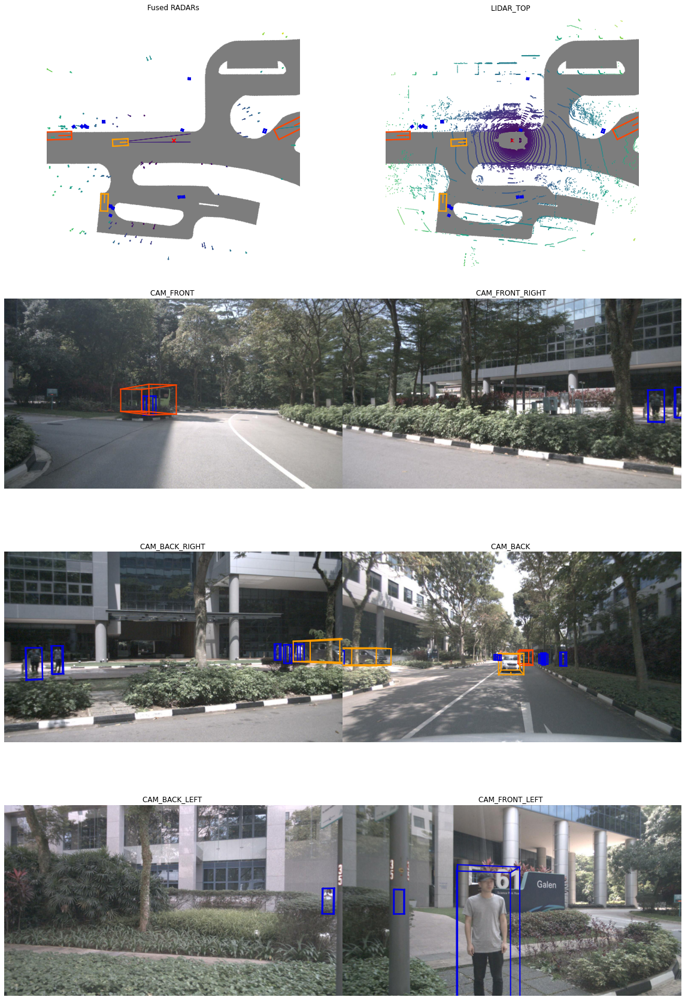

In [14]:
my_sample = nusc.get('sample', sample_token)
nusc.render_sample(sample_token)

#### Visualization as BEV

#### Check BEV representation

In [41]:
import importlib
import custom_prediction.custom_input_representation.interface
import custom_prediction.custom_input_representation.agents
import custom_prediction.helper

importlib.reload(custom_prediction.custom_input_representation.interface)
importlib.reload(custom_prediction.custom_input_representation.agents)
importlib.reload(custom_prediction.helper)
importlib.reload(custom_prediction.custom_input_representation.static_layers)

<module 'custom_prediction.custom_input_representation.static_layers' from 'D:\\ThesisProjects\\Raster-traffic-motion-prediction\\custom_prediction\\custom_input_representation\\static_layers.py'>

In [42]:
from custom_prediction.custom_input_representation.static_layers import StaticLayerRasterizer
from custom_prediction.custom_input_representation.agents import AgentBoxesWithFadedHistory, AgentBoxesWithFutureTrajectory
from custom_prediction.custom_input_representation.interface import InputRepresentation
from custom_prediction.custom_input_representation.combinators import Rasterizer

from typing import Dict

def generate_input_representation(instance_token, sample_token):
    #TODO: Move class initialization away from method
    static_layer_rasterizer = StaticLayerRasterizer(helper)
    agent_rasterizer = AgentBoxesWithFadedHistory(helper, seconds_of_history=1)

    mtp_input_representation = InputRepresentation(static_layer_rasterizer, agent_rasterizer, Rasterizer())

    img = mtp_input_representation.make_input_representation(instance_token, sample_token)

    return img

# For debugging; with visualized predictions
def generate_scene_visualization(instance_token, sample_token, trajectory_predictions:Dict[str, np.ndarray]):
    #TODO: Move class initialization away from method
    static_layer_rasterizer = StaticLayerRasterizer(helper, colorful_lines=False) #, meters_ahead=60, meters_left=30, meters_right=30, meters_behind=50, lanes_in_radius=80)
    agent_rasterizer = AgentBoxesWithFutureTrajectory(helper, trajectory_predictions, seconds_of_history=0) # meters_ahead=60, meters_left=30, meters_right=30, meters_behind=50)

    mtp_input_representation = InputRepresentation(static_layer_rasterizer, agent_rasterizer, Rasterizer())

    img = mtp_input_representation.make_input_representation(instance_token, sample_token)

    return img

In [43]:
random_instance_token_on_sample = helper.get_annotations_for_sample(sample_token)[0]['instance_token']

trajectory_prediction = helper.get_future_for_agent(random_instance_token_on_sample, sample_token, seconds=3, in_agent_frame=True)
print(trajectory_prediction)

[[-0.00173208 -0.01555635]
 [-0.00262471 -0.03165613]
 [-0.0043568  -0.04721248]
 [-0.00608888 -0.06276883]
 [-0.00608888 -0.06276883]
 [-0.00608888 -0.06276883]]


In [44]:
all_prediction_dict = {instance_token: trajectory_prediction}

In [45]:
def show_img(img, size=4):
    plt.figure(figsize=(size, size))
    plt.axis('off')
    plt.imshow(img)
    plt.show()

Gen time: 0.921 sec; shape: (500, 500, 3)


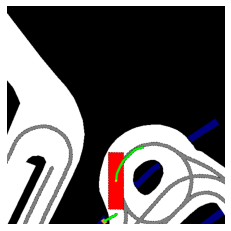

In [46]:
import time

start_time = time.time()

img = generate_scene_visualization(instance_token, sample_token, all_prediction_dict)
print(f'Gen time: {round(time.time() - start_time, 3)} sec; shape: {img.shape}')

show_img(img)

Gen time: 1.129 sec; shape: (500, 500, 3)


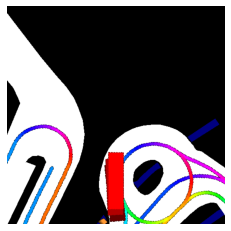

In [47]:
import time

start_time = time.time()

img = generate_input_representation(instance_token, sample_token)
print(f'Gen time: {round(time.time() - start_time, 3)} sec; shape: {img.shape}')

show_img(img)

#### Show sequence of BEV images

In [8]:
import matplotlib.pyplot as plt
import datetime

def get_input_representation_sequence(target_instance_token, start_prediction_sample_token, prediction_length):
    
    current_annotation = helper.get_sample_annotation(target_instance_token, start_prediction_sample_token)
    current_prediction_annotation_token = current_annotation['token']
    
    current_sample = nusc.get('sample', current_annotation['sample_token'])
    current_timestamp = current_sample['timestamp']
    
    images_to_gif = []
    
    for i in range(prediction_length * 2):
        current_sample = nusc.get('sample', current_annotation['sample_token'])
        #timestamp = datetime.datetime.fromtimestamp(current_sample['timestamp'] / 1000000.0)

#         nusc.render_annotation(current_annotation['token'])
        current_annotation = nusc.get('sample_annotation', current_annotation['next'])

        img = generate_input_representation(instance_token, current_annotation['sample_token'])
        show_img(img)
        
        images_to_gif.append(img)
        
        if current_annotation['next'] == '':
            break
        
    return images_to_gif

In [9]:
def get_scene_representation_sequence(target_instance_token, start_prediction_sample_token, prediction_length):

    current_sample_token = start_prediction_sample_token
    #current_timestamp = current_sample['timestamp']

    images_to_gif = []

    for i in range(prediction_length * 2):
        current_sample = nusc.get('sample', current_sample_token)
        #timestamp = datetime.datetime.fromtimestamp(current_sample['timestamp'] / 1000000.0)

        #nusc.render_annotation(current_annotation['token'])
        #current_annotation = nusc.get('sample_annotation', current_annotation['next'])

        trajectory_prediction = helper.get_future_for_agent(instance_token, current_sample_token, seconds=3, in_agent_frame=True)
        for cord in trajectory_prediction:
            cord[0] = -cord[0]

        all_prediction_dict = {instance_token: trajectory_prediction}

        img = generate_scene_visualization(target_instance_token, current_sample_token, all_prediction_dict)
        show_img(img)

        images_to_gif.append(img)

        # TODO: Get camera's views
        sensor = 'CAM_FRONT'
        cam_front_data = nusc.get('sample_data', current_sample['data'][sensor])
        nusc.render_sample_data(cam_front_data['token'])

        current_sample_token = current_sample['next']

        if current_sample_token == '':
            break

    return images_to_gif

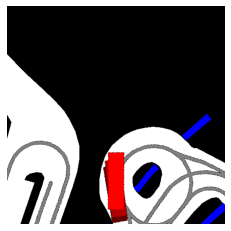

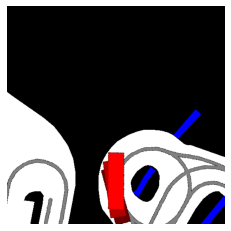

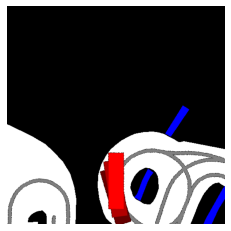

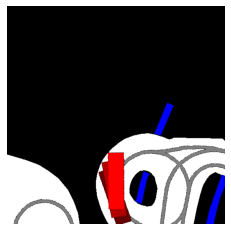

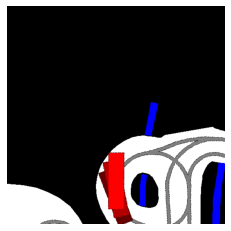

...

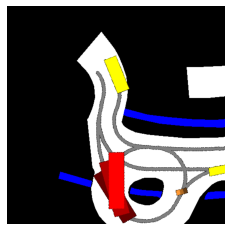

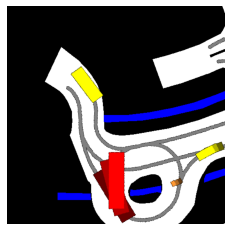

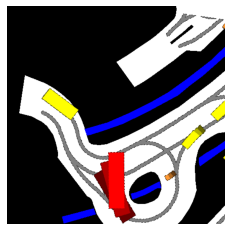

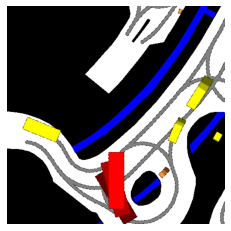

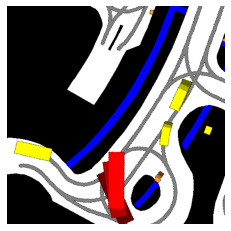

In [56]:
annotation = helper.get_sample_annotation(instance_token, sample_token)
images_to_gif = get_input_representation_sequence(instance_token, sample_token, 12)

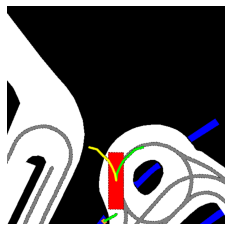

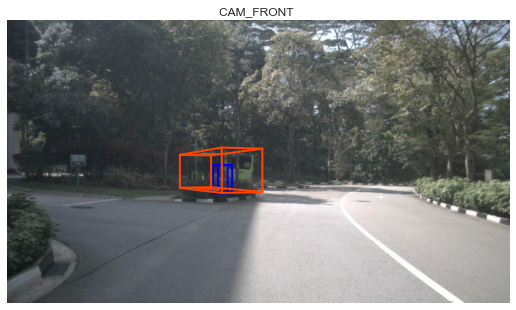

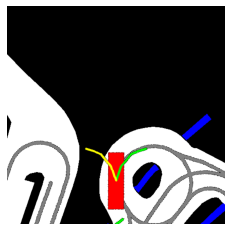

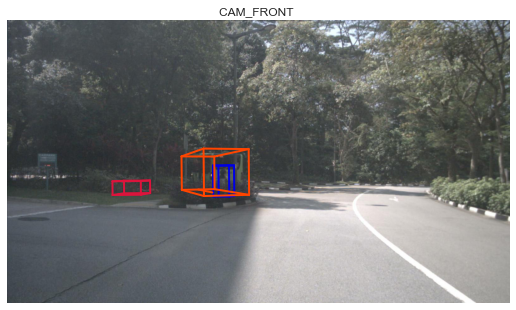

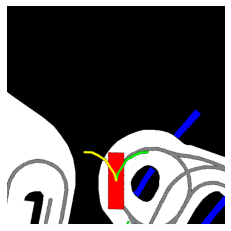

...

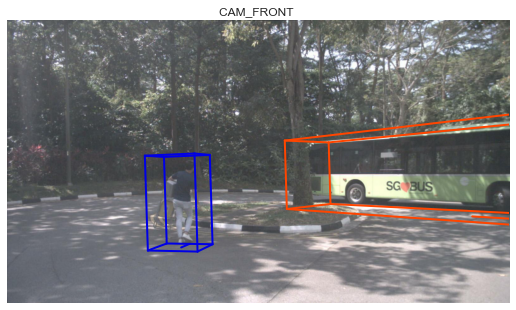

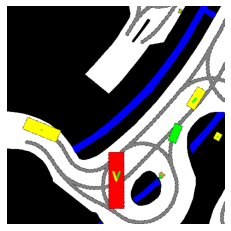

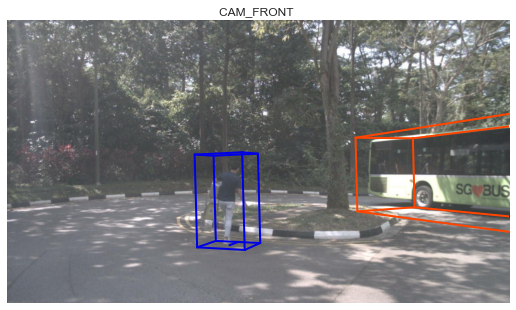

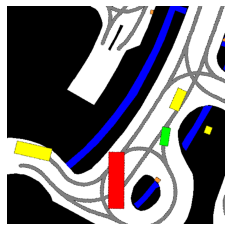

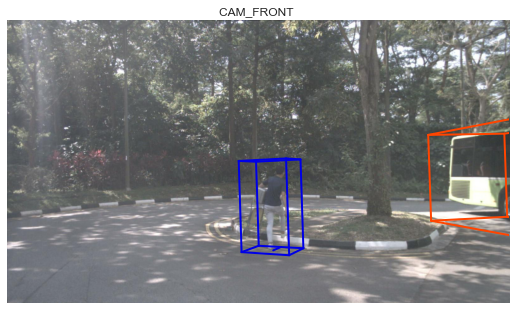

In [44]:
annotation = helper.get_sample_annotation(instance_token, sample_token)

images_to_gif = get_scene_representation_sequence(instance_token, sample_token, 12)

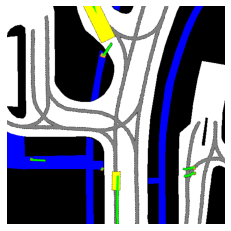

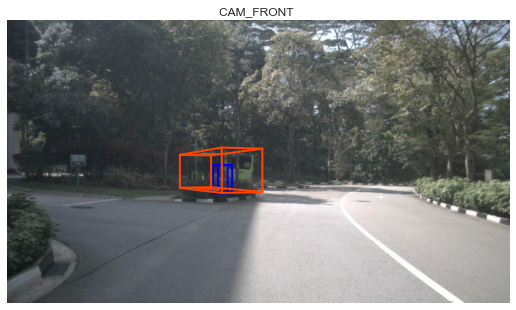

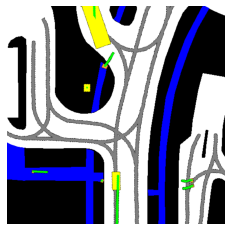

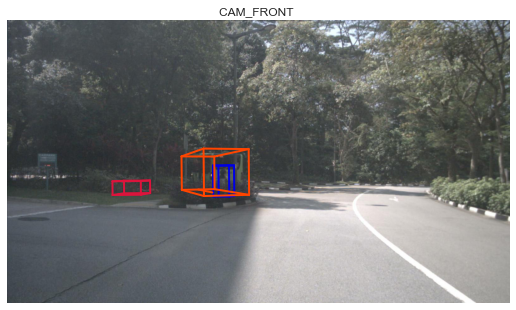

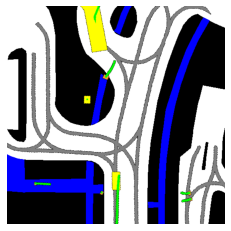

...

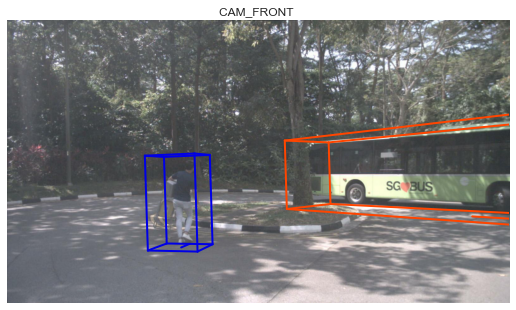

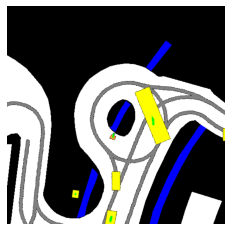

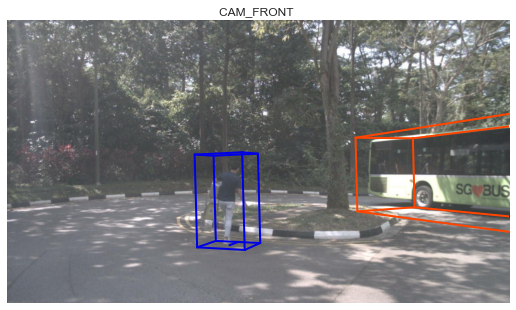

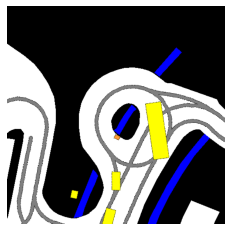

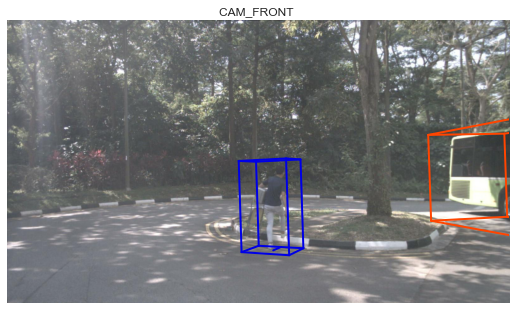

In [57]:
images_to_gif = get_scene_representation_sequence(custom_prediction.helper.EGO_VEHICLE_INSTANCE_TOKEN, sample_token, 12)

In [58]:
import imageio

def save_gif(img_list):
    imageio.mimsave('test.gif', img_list)

save_gif(images_to_gif)

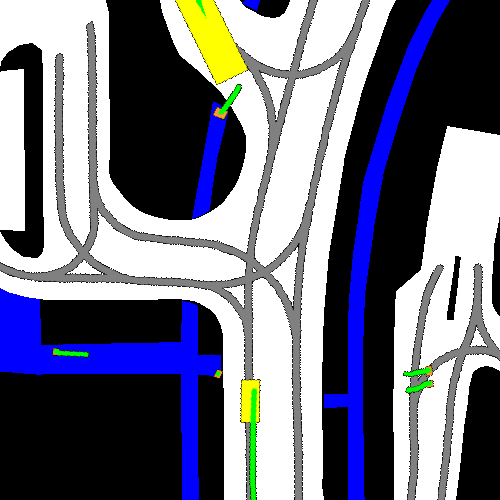

In [62]:
from IPython.display import Image
Image(filename="test.gif", width = 250)

In [63]:
# nusc.render_scene(nusc.scene[0])

#### Check future path

In [52]:
future_xy_local = helper.get_future_for_agent(instance_token, sample_token, seconds=3, in_agent_frame=True)
future_xy_local

array([[ 0.0293615 ,  3.5660356 ],
       [ 0.058766  ,  7.13307028],
       [ 0.0881275 , 10.69910588],
       [ 0.14832378, 14.376919  ],
       [ 0.20947615, 18.05369006],
       [ 0.26967244, 21.73150319]])

In [53]:
future_xy_global = helper.get_future_for_agent(instance_token, sample_token, seconds=3, in_agent_frame=False)
future_xy_global

array([[1827.587,  871.735],
       [1824.022,  871.611],
       [1820.458,  871.487],
       [1816.781,  871.389],
       [1813.105,  871.292],
       [1809.428,  871.194]])

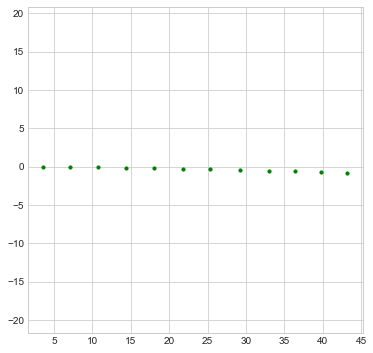

In [54]:
def PlotPathWithPrediction(future, predict=[]):
    plt.figure(figsize=(6, 6))

    plt.scatter(future[:, 1], -future[:, 0], c='g', s=10)
    
    if len(predict) > 0:
        plt.scatter(predict[:, 1], -predict[:, 0], c='yellow', s=10)

    # Keep aspect ratio of axis
    plt.axis('equal')
    plt.show()


gt = helper.get_future_for_agent(instance_token, sample_token, prediction_length, in_agent_frame=True)
    
PlotPathWithPrediction(gt)